In [1]:
import pandas as pd

import geopandas as gpd

import contextily as ctx

import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

import matplotlib.pyplot as plt

import plotly.express as px

import seaborn as sns

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
Smallplex_Data = gpd.read_file('data/Smallplex Data New.csv')

In [3]:
Neighborhood_Boundaries = gpd.read_file('data/LA_Times_Neighborhood_Boundaries.zip')

In [4]:
Smallplex_Data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16002 entries, 0 to 16001
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Permit Type             16002 non-null  object  
 1   Initiating Office       16002 non-null  object  
 2   Issue Datw              16002 non-null  object  
 3   Valuation               16002 non-null  object  
 4   # of Residential Units  16002 non-null  object  
 5   Zone                    16002 non-null  object  
 6   Latitude                16002 non-null  object  
 7   Longitude               16002 non-null  object  
 8   geometry                0 non-null      geometry
dtypes: geometry(1), object(8)
memory usage: 1.1+ MB


In [5]:
Smallplex_Data.sample(5)

,Permit Type,Initiating Office,Issue Datw,Valuation,# of Residential Units,Zone,Latitude,Longitude,geometry
1902,Bldg-New,METRO,7/17/2013,1156000,1,R1-1,34.04913,-118.3914,None
12842,Bldg-New,SOUTH LA,2/13/2020,378800,2,R3-1,34.08868,-118.31483,None
14333,Bldg-New,METRO,5/29/2013,339350,2,R2-1,33.94841,-118.27066,None
13425,Bldg-New,METRO,9/25/2013,398900,2,R3-1,33.958,-118.27706,None
13325,Bldg-New,METRO,4/22/2013,385200,2,R2-1,33.94204,-118.26846,None


In [6]:
Smallplex_Data_With_Geometry = gpd.GeoDataFrame(Smallplex_Data,
                                                crs='epsg:4326',
                                                geometry= gpd.points_from_xy(Smallplex_Data.Longitude, Smallplex_Data.Latitude))

In [7]:
Smallplex_Data_With_Geometry.sample(5)

,Permit Type,Initiating Office,Issue Datw,Valuation,# of Residential Units,Zone,Latitude,Longitude,geometry
15499,Bldg-New,SOUTH LA,12/1/2020,414000,2,RD1.5-1,34.01455,-118.30114,POINT (-118.30114 34.01455)
9614,Bldg-New,SOUTH LA,2/14/2017,20000,1,[Q]R1-1D,34.07825,-118.17273,POINT (-118.17273 34.07825)
15843,Bldg-New,WEST LA,6/3/2020,788000,4,RD1.5-1,33.8437,-118.30716,POINT (-118.30716 33.84370)
8490,Bldg-New,METRO,7/26/2013,500000,1,R1-1,34.11493,-118.2263,POINT (-118.22630 34.11493)
1903,Bldg-New,WEST LA,2/10/2016,1017600,1,R2-1XL,34.08602,-118.3583,POINT (-118.35830 34.08602)


In [8]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [9]:
Smallplex_Data_With_Geometry['Latitude'] = Smallplex_Data_With_Geometry.Latitude.astype(float)
Smallplex_Data_With_Geometry['Longitude'] = Smallplex_Data_With_Geometry.Longitude.astype(float)

In [10]:
Smallplex_Data_With_Geometry = Smallplex_Data_With_Geometry.to_crs(epsg=4326)

<AxesSubplot:>

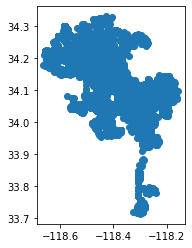

In [11]:
Smallplex_Data_With_Geometry.plot()

In [12]:
Neighborhood_Boundaries.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  114 non-null    int64   
 1   name      114 non-null    object  
 2   geometry  114 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 2.8+ KB


In [13]:
Neighborhood_Boundaries.sample(5)

,OBJECTID,name,geometry
102,103,Watts,"POLYGON ((-118.24423 33.95379, -118.24423 33.9..."
31,32,Exposition Park,"POLYGON ((-118.29155 34.01837, -118.28294 34.0..."
37,38,Green Meadows,"POLYGON ((-118.25411 33.95104, -118.25411 33.9..."
70,71,Palms,"POLYGON ((-118.38835 34.02949, -118.38778 34.0..."
24,25,Eagle Rock,"POLYGON ((-118.19820 34.15160, -118.19821 34.1..."


In [14]:
columns_to_keep_2 = ['name',
                     'geometry']

In [15]:
Neighborhood_Boundaries = Neighborhood_Boundaries[columns_to_keep_2]

In [16]:
Neighborhood_Boundaries

,name,geometry
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."
5,Bel-Air,"POLYGON ((-118.46165 34.13077, -118.46077 34.1..."
6,Beverly Crest,"POLYGON ((-118.42910 34.07920, -118.42929 34.0..."
7,Beverly Grove,"POLYGON ((-118.37251 34.09026, -118.37250 34.0..."
8,Beverlywood,"POLYGON ((-118.38609 34.04675, -118.38934 34.0..."
9,Boyle Heights,"POLYGON ((-118.19263 34.06077, -118.19260 34.0..."


<AxesSubplot:>

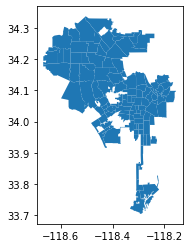

In [17]:
Neighborhood_Boundaries.plot()

In [18]:
Neighborhood_Boundaries = Neighborhood_Boundaries.to_crs(epsg=4326)

/opt/conda/lib/python3.9/site-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


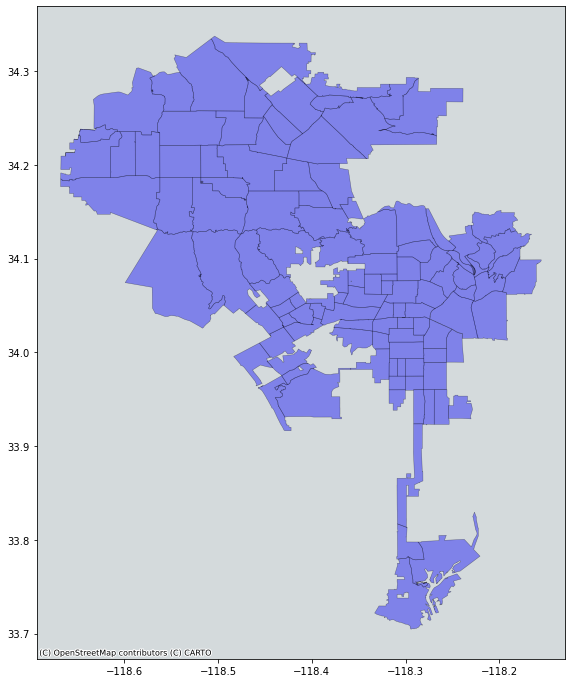

In [19]:
fig, ax = plt.subplots(figsize=(12,12))

Neighborhood_Boundaries.plot(ax=ax,
         color='blue', 
         edgecolor='black',
         lw=0.5,
         alpha=0.4)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

/opt/conda/lib/python3.9/site-packages/contextily/tile.py:581: UserWarning: The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


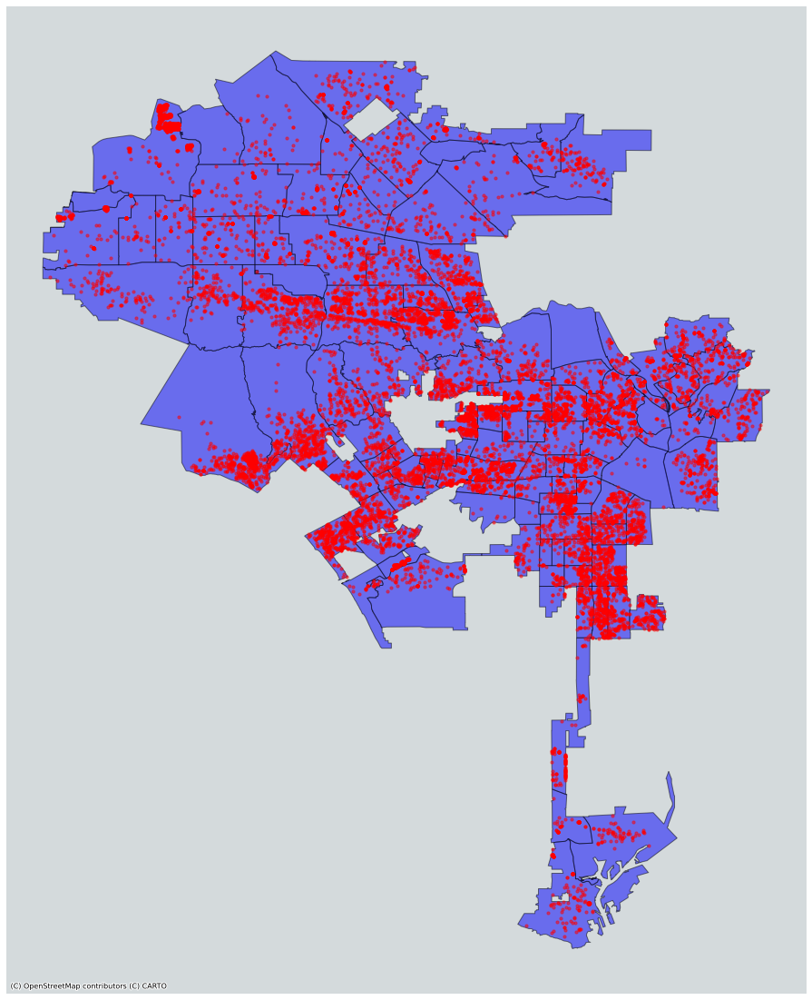

In [20]:
fig, ax = plt.subplots(figsize=(20, 20))

Neighborhood_Boundaries.plot(ax=ax,
        color='blue', 
        edgecolor='black',
        alpha=0.5)

Smallplex_Data_With_Geometry.plot(ax=ax,
            color='red',
            markersize=10,
            alpha=0.5)


ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [21]:
Combined_Data = gpd.sjoin(Smallplex_Data_With_Geometry, Neighborhood_Boundaries,how='left')

Combined_Data.tail(20)

,Permit Type,Initiating Office,Issue Datw,Valuation,# of Residential Units,Zone,Latitude,Longitude,geometry,index_right,name
15982,Bldg-New,VAN NUYS,2/10/2021,785000,4,RD1.5-1,34.16339,-118.36136,POINT (-118.36136 34.16339),91.0,Toluca Lake
15983,Bldg-New,VAN NUYS,2/10/2021,785000,4,RD1.5-1,34.16349,-118.36136,POINT (-118.36136 34.16349),91.0,Toluca Lake
15984,Bldg-New,METRO,12/20/2017,2601489,4,(Q)RD2-1,34.04951,-118.46995,POINT (-118.46995 34.04951),10.0,Brentwood
15985,Bldg-New,VAN NUYS,6/11/2019,620000,4,RD1.5-1XL,33.73627,-118.30701,POINT (-118.30701 33.73627),79.0,San Pedro
15986,Bldg-New,VAN NUYS,11/7/2018,900000,4,[Q]RD1.5-1,34.18683,-118.44372,POINT (-118.44372 34.18683),96.0,Van Nuys
15987,Bldg-New,VAN NUYS,3/4/2020,1030000,4,R1-1-RIO,34.15506,-118.39670,POINT (-118.39670 34.15506),95.0,Valley Village
15988,Bldg-New,METRO,8/20/2019,12139287,4,R4-1,33.96577,-118.42406,POINT (-118.42406 33.96577),104.0,Westchester
15989,Bldg-New,VAN NUYS,5/18/2021,2000000,4,RD1.5-1VL,34.08981,-118.27802,POINT (-118.27802 34.08981),84.0,Silver Lake
15990,Bldg-New,VAN NUYS,11/7/2017,900000,4,R1-1,34.17768,-118.40552,POINT (-118.40552 34.17768),94.0,Valley Glen
15991,Bldg-New,VAN NUYS,4/8/2016,1320000,4,RD1.5-1,34.19540,-118.39526,POINT (-118.39526 34.19540),66.0,North Hollywood


In [22]:
Smallplexes_By_Neighborhood = Combined_Data.name.value_counts().rename_axis('name').reset_index(name='housing units')

In [23]:
Single_Family_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='1'].name.value_counts().rename_axis('name').reset_index(name='single family')

In [24]:
Duplexes_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='2'].name.value_counts().rename_axis('name').reset_index(name='duplex')

In [25]:
Triplexes_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='3'].name.value_counts().rename_axis('name').reset_index(name='triplex')

In [26]:
Fourplexes_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='4'].name.value_counts().rename_axis('name').reset_index(name='fourplex')

In [27]:
Smallplexes_By_Neighborhood.head()

,name,housing units
0,Chatsworth,825
1,Mid-City,549
2,Sherman Oaks,493
3,Pacific Palisades,471
4,Studio City,433


In [28]:
Single_Family_By_Neighborhood.head()

,name,single family
0,Chatsworth,810
1,Sherman Oaks,478
2,Pacific Palisades,463
3,Encino,428
4,Studio City,418


In [29]:
Duplexes_By_Neighborhood.head()

,name,duplex
0,Florence,311
1,Mid-City,199
2,Broadway-Manchester,179
3,East Hollywood,177
4,Exposition Park,171


In [30]:
Triplexes_By_Neighborhood.head()

,name,triplex
0,Playa Vista,38
1,Van Nuys,11
2,Boyle Heights,6
3,East Hollywood,6
4,North Hollywood,6


In [31]:
Fourplexes_By_Neighborhood.head()

,name,fourplex
0,North Hollywood,18
1,Sylmar,9
2,Valley Glen,8
3,Chatsworth,7
4,Northridge,7


In [32]:
Neighborhood_Boundaries=Neighborhood_Boundaries.merge(Smallplexes_By_Neighborhood,on='name')

In [33]:
Neighborhood_Boundaries_2=Neighborhood_Boundaries.merge(Triplexes_By_Neighborhood,on='name')

In [34]:
Neighborhood_Boundaries_1=Neighborhood_Boundaries.merge(Duplexes_By_Neighborhood,on='name')

In [35]:
Neighborhood_Boundaries_3=Neighborhood_Boundaries.merge(Fourplexes_By_Neighborhood,on='name')

In [36]:
Neighborhood_Boundaries.sample(5)

,name,geometry,housing units
89,University Park,"POLYGON ((-118.27986 34.01848, -118.28294 34.0...",46
45,Hollywood Hills West,"POLYGON ((-118.36956 34.12922, -118.36952 34.1...",227
34,Gramercy Park,"POLYGON ((-118.30041 33.95002, -118.30073 33.9...",10
106,Windsor Square,"POLYGON ((-118.31404 34.06254, -118.31420 34.0...",8
32,Florence,"POLYGON ((-118.25645 33.98246, -118.25641 33.9...",373


In [37]:
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [38]:
Neighborhood_Boundaries = Neighborhood_Boundaries.to_crs('epsg:4326')

In [39]:
Neighborhood_Boundaries_1 = Neighborhood_Boundaries_1.to_crs('epsg:4326')

In [40]:
Neighborhood_Boundaries_2 = Neighborhood_Boundaries_2.to_crs('epsg:4326')

In [41]:
Neighborhood_Boundaries_3 = Neighborhood_Boundaries_3.to_crs('epsg:4326')

In [42]:
minx, miny, maxx, maxy = Neighborhood_Boundaries.geometry.total_bounds
center_lat = (maxy-miny)/2+miny
center_lon = (maxx-minx)/2+minx

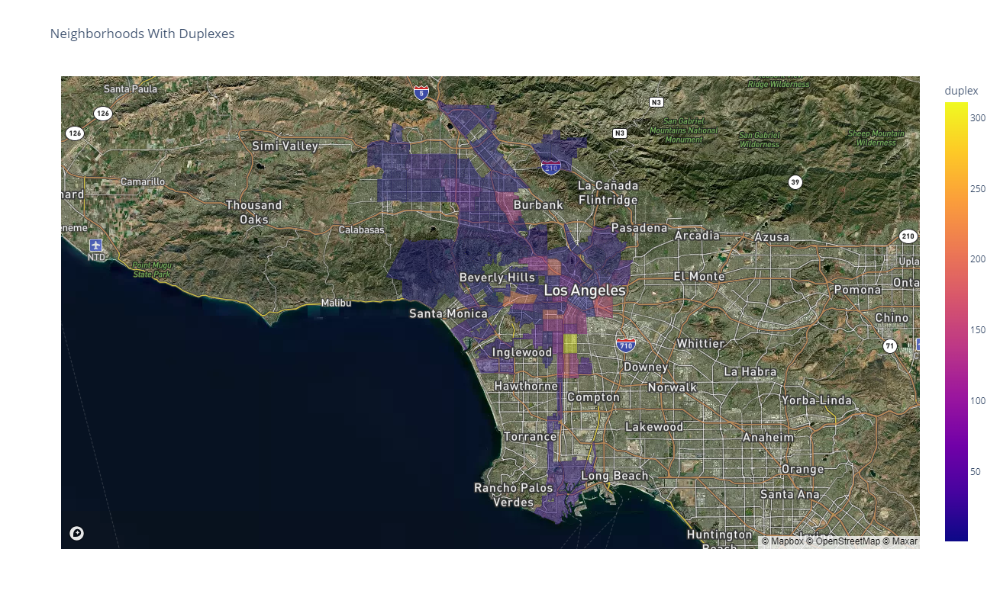

In [43]:
px.choropleth_mapbox(Neighborhood_Boundaries_1, 
                     geojson=Neighborhood_Boundaries_1.geometry, 
                     locations=Neighborhood_Boundaries_1.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','duplex'],
                     opacity=0.4,
                     height=800,
                     color='duplex',
                     title= 'Neighborhoods With Duplexes')

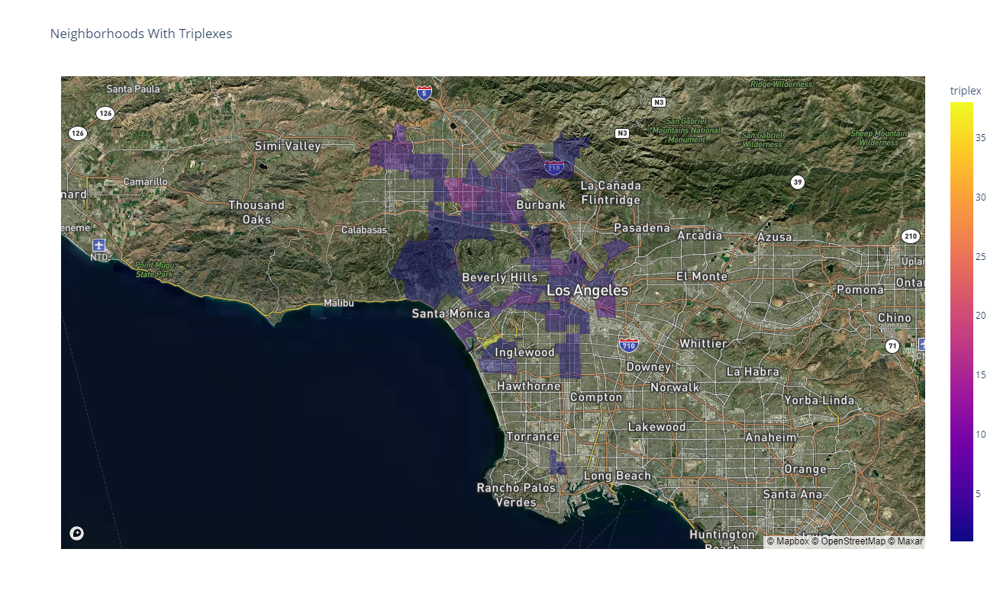

In [44]:
px.choropleth_mapbox(Neighborhood_Boundaries_2, 
                     geojson=Neighborhood_Boundaries_2.geometry, 
                     locations=Neighborhood_Boundaries_2.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','triplex'],
                     opacity=0.4,
                     height=800,
                     color='triplex',
                     title= 'Neighborhoods With Triplexes')

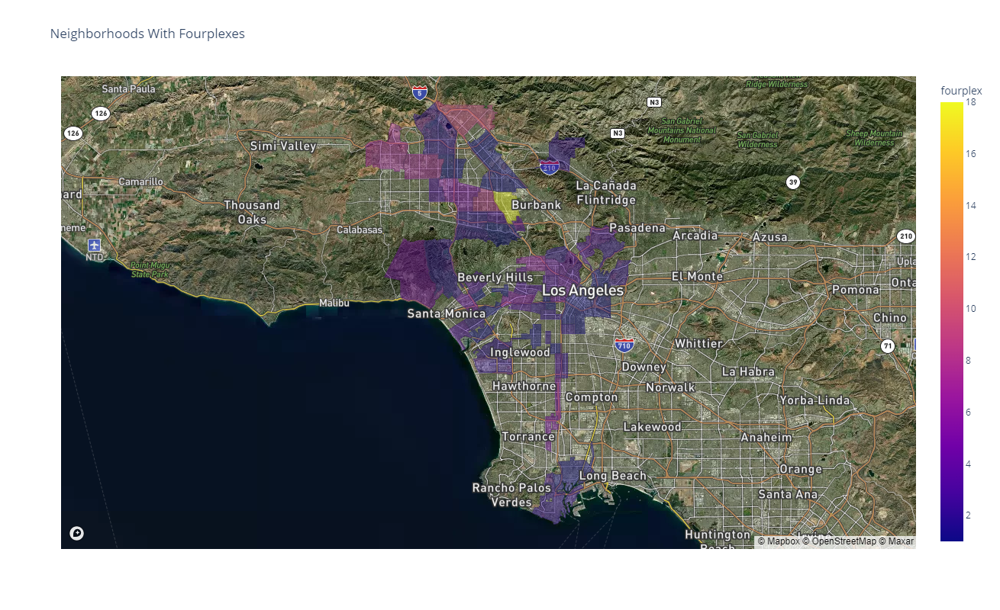

In [45]:
px.choropleth_mapbox(Neighborhood_Boundaries_3, 
                     geojson=Neighborhood_Boundaries_3.geometry, 
                     locations=Neighborhood_Boundaries_3.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','fourplex'],
                     opacity=0.4,
                     height=800,
                     color='fourplex',
                     title= 'Neighborhoods With Fourplexes')

In [47]:
px.choropleth_mapbox(Neighborhood_Boundaries_1, 
                     geojson=Neighborhood_Boundaries_1.geometry, 
                     locations=Neighborhood_Boundaries_1.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','duplex'],
                     opacity=0.4,
                     height=800,
                     color='duplex',
                     title= 'Neighborhoods Duplexes').write_html("Neighborhoods With Duplexes.html")

In [48]:
px.choropleth_mapbox(Neighborhood_Boundaries_2, 
                     geojson=Neighborhood_Boundaries_2.geometry, 
                     locations=Neighborhood_Boundaries_2.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','triplex'],
                     opacity=0.4,
                     height=800,
                     color='triplex',
                     title= 'Neighborhoods With Triplexes').write_html("Neighborhoods With Triplexes.html")

In [49]:
px.choropleth_mapbox(Neighborhood_Boundaries_3, 
                     geojson=Neighborhood_Boundaries_3.geometry, 
                     locations=Neighborhood_Boundaries_3.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','fourplex'],
                     opacity=0.4,
                     height=800,
                     color='fourplex',
                     title= 'Neighborhoods With Fourplexes').write_html("Neighborhoods With Fourplexes.html")